In [ ]:
seq_file_name='600_41n20_1_2mm_-161_08_05_51_044'
# seq_file_name='600_41n20_1_2mm_-161_08_04_23_216'
# seq_file_name='600_41n20_1_2mm_-161_08_03_50_784'
# seq_file_name='600_41n20_1_2mm_-161_08_04_23_216'
# seq_file_name = '625_38n18_1_2mm_-161_07_41_19_806'
# seq_file_name = '600_56n17_1mm_-161_09_29_59_808'
# seq_file_name = '600_51n12_1_2mm_-161_09_02_18_483'

In [14]:
from flirpy.io.seq import Splitter
import logging 

logging.basicConfig(level=logging.DEBUG)

seq_file = f"../seq_spoiny/{seq_file_name}.seq"
output_folder = "../frames_output"

splitter = Splitter(
    output_folder=output_folder, 
    exiftool_path='/usr/bin/exiftool',
    width=640, 
    height=480
)

splitter.process([seq_file])

print(f"Klatki zapisane w folderze: {output_folder}")

INFO:flirpy.util.exiftool:Exiftool path verified at /usr/bin/exiftool
INFO:flirpy.io.seq:Splitting 1 files
  0%|          | 0/1 [00:00<?, ?it/s]INFO:flirpy.io.seq:Splitting ./seq_spoiny/600_51n12_1_2mm_-161_09_02_18_483.seq into ./frames_output/600_51n12_1_2mm_-161_09_02_18_483
DEBUG:flirpy.io.seq:Processing ./seq_spoiny/600_51n12_1_2mm_-161_09_02_18_483.seq
DEBUG:flirpy.util.exiftool:/usr/bin/exiftool -ext fff . -w! .txt
--- Logging error ---
Traceback (most recent call last):
  File "/home/dburcon/.pyenv/versions/3.10.15/lib/python3.10/logging/__init__.py", line 1100, in emit
    msg = self.format(record)
  File "/home/dburcon/.pyenv/versions/3.10.15/lib/python3.10/logging/__init__.py", line 943, in format
    return fmt.format(record)
  File "/home/dburcon/.pyenv/versions/3.10.15/lib/python3.10/logging/__init__.py", line 678, in format
    record.message = record.getMessage()
  File "/home/dburcon/.pyenv/versions/3.10.15/lib/python3.10/logging/__init__.py", line 368, in getMessage
 

DEBUG:PIL.TiffImagePlugin:save: ImageLength (257) - type: long (4) - value: (480,)
DEBUG:PIL.TiffImagePlugin:Tag 258, Type: 3, Value: (16,)
DEBUG:PIL.TiffImagePlugin:save: BitsPerSample (258) - type: short (3) - value: (16,)
DEBUG:PIL.TiffImagePlugin:Tag 259, Type: 3, Value: 1
DEBUG:PIL.TiffImagePlugin:save: Compression (259) - type: short (3) - value: (1,)
DEBUG:PIL.TiffImagePlugin:Tag 262, Type: 3, Value: 1
DEBUG:PIL.TiffImagePlugin:save: PhotometricInterpretation (262) - type: short (3) - value: (1,)
DEBUG:PIL.TiffImagePlugin:Tag 273, Type: 4, Value: (0,)
DEBUG:PIL.TiffImagePlugin:save: StripOffsets (273) - type: long (4) - value: (0,)
DEBUG:PIL.TiffImagePlugin:Tag 278, Type: 4, Value: 480
DEBUG:PIL.TiffImagePlugin:save: RowsPerStrip (278) - type: long (4) - value: (480,)
DEBUG:PIL.TiffImagePlugin:Tag 279, Type: 4, Value: (614400,)
DEBUG:PIL.TiffImagePlugin:save: StripByteCounts (279) - type: long (4) - value: (614400,)
DEBUG:PIL.TiffImagePlugin:Tag 284, Type: 3, Value: 1
DEBUG:PIL.

Klatki zapisane w folderze: ./frames_output


In [15]:
import imageio.v2 as imageio
import numpy as np
import cv2
import os
from glob import iglob
import csv

# Pobranie listy TIFF
tiff_frames = sorted(list(iglob(f"../frames_output/{seq_file_name}/radiometric/*.tiff")))

# Folder na poprawione podglądy
preview_fixed_dir = f"../frames_output/{seq_file_name}/preview_fixed/"
os.makedirs(preview_fixed_dir, exist_ok=True)

# Ścieżka do pliku CSV
csv_output_path = f"../frames_output/{seq_file_name}/temperature_stats.csv"

# Przygotuj plik CSV i zapisz nagłówki
with open(csv_output_path, "w", newline="") as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow([
        "Frame", "MinTemp", "MaxTemp", "AvgTemp",
        "WeldAvgTemp", "WeldStdTemp",
        "BottomAvgTemp", "BottomHotPx",
        "MiddleAvgTemp"
    ])

for frame in tiff_frames:
    print(f"\n Przetwarzam: {frame}")

    # Wczytaj TIFF
    thermal_image = imageio.imread(frame).astype(np.float32)

    # Konwersja do temperatury w °C
    thermal_image_celsius = (thermal_image / 10) - 273.15

    h, w = thermal_image_celsius.shape

    # --- Strefy analizy ---
    weld_band = thermal_image_celsius[:, w//2 - 40 : w//2 + 40]  # ~środkowy pas (spoina)
    bottom_band = weld_band[h - 40 :, :]                         # dolna część (łuk)
    middle_band = weld_band[200:400, :]                          # środkowy przetop

    # --- Oblicz metryki ---
    min_temp_full = np.min(thermal_image_celsius)
    max_temp_full = np.max(thermal_image_celsius)
    avg_temp_full = np.mean(thermal_image_celsius)

    weld_avg_temp = np.mean(weld_band)
    weld_std_temp = np.std(weld_band)

    bottom_avg_temp = np.mean(bottom_band)
    bottom_hot_px = np.sum(bottom_band > 500)  # Próg np. 500°C – do modyfikacji

    middle_avg_temp = np.mean(middle_band)

    # --- Normalizacja do podglądu ---
    min_temp, max_temp = np.percentile(thermal_image_celsius, 1), np.percentile(thermal_image_celsius, 99)
    normalized = np.clip(thermal_image_celsius, min_temp, max_temp)
    normalized = ((normalized - min_temp) / (max_temp - min_temp)) * 255.0
    normalized = np.uint8(normalized)
    colored = cv2.applyColorMap(normalized, cv2.COLORMAP_INFERNO)

    # --- Zapis podglądu ---
    output_path = os.path.join(preview_fixed_dir, os.path.basename(frame).replace(".tiff", ".jpg"))
    cv2.imwrite(output_path, colored)
    print(f"Zapisano: {output_path}")

    # --- Zapis do CSV ---
    with open(csv_output_path, "a", newline="") as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow([
            os.path.basename(frame), min_temp_full, max_temp_full, avg_temp_full,
            weld_avg_temp, weld_std_temp,
            bottom_avg_temp, bottom_hot_px,
            middle_avg_temp
        ])

    print(f"Statystyki zapisane do: {csv_output_path}")



 Przetwarzam: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483/radiometric/frame_000000.tiff
Zapisano: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483/preview_fixed/frame_000000.jpg
Statystyki zapisane do: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483/temperature_stats.csv

 Przetwarzam: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483/radiometric/frame_000001.tiff
Zapisano: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483/preview_fixed/frame_000001.jpg
Statystyki zapisane do: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483/temperature_stats.csv

 Przetwarzam: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483/radiometric/frame_000002.tiff
Zapisano: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483/preview_fixed/frame_000002.jpg
Statystyki zapisane do: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483/temperature_stats.csv

 Przetwarzam: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483/radiometric/frame_000003.tiff
Zapisano: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483

/tmp/ipykernel_4059/1923591222.py:35: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  thermal_image_celsius = (thermal_image / 10) - 273.15
/tmp/ipykernel_4059/1923591222.py:53: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  bottom_hot_px = np.sum(bottom_band > 500)  # Próg np. 500°C – do modyfikacji
/tmp/ipykernel_4059/1923591222.py:60: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  normalized = ((normalized - min_temp) / (max_temp - min_temp)) * 255.0


Zapisano: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483/preview_fixed/frame_000011.jpg
Statystyki zapisane do: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483/temperature_stats.csv

 Przetwarzam: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483/radiometric/frame_000012.tiff
Zapisano: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483/preview_fixed/frame_000012.jpg
Statystyki zapisane do: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483/temperature_stats.csv

 Przetwarzam: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483/radiometric/frame_000013.tiff
Zapisano: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483/preview_fixed/frame_000013.jpg
Statystyki zapisane do: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483/temperature_stats.csv

 Przetwarzam: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483/radiometric/frame_000014.tiff
Zapisano: ./frames_output/600_51n12_1_2mm_-161_09_02_18_483/preview_fixed/frame_000014.jpg
Statystyki zapisane do: ./frames_output/600_51n12_1_2mm_-161_09

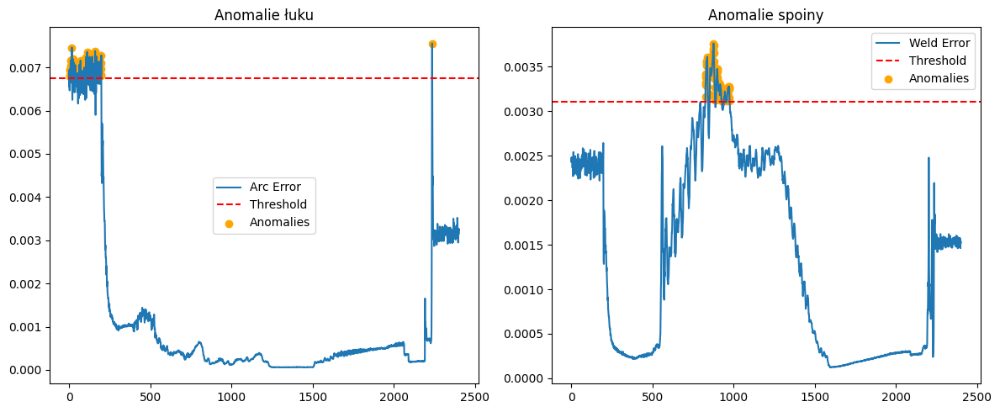


[ANOMALIE ŁUKU]
frame_000001.jpg - error = 0.0070
frame_000003.jpg - error = 0.0070
frame_000004.jpg - error = 0.0068
frame_000005.jpg - error = 0.0068
frame_000006.jpg - error = 0.0068
frame_000007.jpg - error = 0.0070
frame_000008.jpg - error = 0.0070
frame_000009.jpg - error = 0.0072
frame_000010.jpg - error = 0.0068
frame_000011.jpg - error = 0.0072
frame_000012.jpg - error = 0.0069
frame_000015.jpg - error = 0.0068
frame_000016.jpg - error = 0.0075
frame_000017.jpg - error = 0.0068
frame_000021.jpg - error = 0.0069
frame_000022.jpg - error = 0.0072
frame_000023.jpg - error = 0.0071
frame_000025.jpg - error = 0.0070
frame_000026.jpg - error = 0.0070
frame_000028.jpg - error = 0.0069
frame_000029.jpg - error = 0.0071
frame_000030.jpg - error = 0.0070
frame_000035.jpg - error = 0.0069
frame_000038.jpg - error = 0.0071
frame_000043.jpg - error = 0.0068
frame_000044.jpg - error = 0.0068
frame_000045.jpg - error = 0.0068
frame_000047.jpg - error = 0.0068
frame_000048.jpg - error = 0.00

In [16]:
import os
import glob
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader

# --- ŚCIEŻKI ---
NEW_IMAGE_DIR = f'../frames_output/{seq_file_name}/preview_fixed'  # zmień na swój katalog
MODEL_ARC_PATH = '../models/autoencoder_arc_reference.pth'
MODEL_WELD_PATH = '../models/autoencoder_weld_reference.pth'
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
IMAGE_SIZE = (64, 64)

# --- TRANSFORMACJE ---
transform = transforms.Compose([
    transforms.Grayscale(),
    transforms.Resize(IMAGE_SIZE),
    transforms.ToTensor(),
])

# --- STRUKTURA MODELU ---
class ConvAutoencoder(nn.Module):
    def __init__(self):
        super(ConvAutoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(8, 16, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(32, 16, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(16, 8, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(8, 1, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.decoder(self.encoder(x))

# --- ŁADOWANIE MODELÓW ---
model_arc = ConvAutoencoder().to(DEVICE)
model_arc.load_state_dict(torch.load(MODEL_ARC_PATH))
model_arc.eval()

model_weld = ConvAutoencoder().to(DEVICE)
model_weld.load_state_dict(torch.load(MODEL_WELD_PATH))
model_weld.eval()

# --- DATASET Z ROIs ---
class ThermalDatasetMultiROI(Dataset):
    def __init__(self, image_dir, transform=None):
        self.files = sorted(glob.glob(os.path.join(image_dir, "*.jpg")))
        self.transform = transform
        self.roi_arc = (295, 410, 345, 480)
        self.roi_weld = (270, 250, 370, 400)

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img = Image.open(self.files[idx])
        arc_crop = img.crop(self.roi_arc)
        weld_crop = img.crop(self.roi_weld)
        if self.transform:
            arc_crop = self.transform(arc_crop)
            weld_crop = self.transform(weld_crop)
        return arc_crop, weld_crop, os.path.basename(self.files[idx])

# --- DANE I PRZETWARZANIE ---
dataset = ThermalDatasetMultiROI(NEW_IMAGE_DIR, transform=transform)
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)
criterion = nn.MSELoss()

errors_arc, errors_weld, filenames = [], [], []

with torch.no_grad():
    for arc, weld, fname in dataloader:
        arc = arc.to(DEVICE)
        weld = weld.to(DEVICE)

        recon_arc = model_arc(arc)
        recon_weld = model_weld(weld)

        err_arc = criterion(recon_arc, arc).item()
        err_weld = criterion(recon_weld, weld).item()

        errors_arc.append(err_arc)
        errors_weld.append(err_weld)
        filenames.append(fname[0])

# --- PROGI I WYKRYWANIE ---
threshold_arc = np.percentile(errors_arc, 95)
threshold_weld = np.percentile(errors_weld, 95)

anomalies_arc = [i for i, e in enumerate(errors_arc) if e > threshold_arc]
anomalies_weld = [i for i, e in enumerate(errors_weld) if e > threshold_weld]

# --- WIZUALIZACJA ---
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(errors_arc, label="Arc Error")
plt.axhline(threshold_arc, color='r', linestyle='--', label='Threshold')
plt.scatter(anomalies_arc, [errors_arc[i] for i in anomalies_arc], color='orange', label='Anomalies')
plt.title("Anomalie łuku")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(errors_weld, label="Weld Error")
plt.axhline(threshold_weld, color='r', linestyle='--', label='Threshold')
plt.scatter(anomalies_weld, [errors_weld[i] for i in anomalies_weld], color='orange', label='Anomalies')
plt.title("Anomalie spoiny")
plt.legend()

plt.tight_layout()
plt.show()

# --- WYDRUK ---
print("\n[ANOMALIE ŁUKU]")
for i in anomalies_arc:
    print(f"{filenames[i]} - error = {errors_arc[i]:.4f}")

print("\n[ANOMALIE SPOINY]")
for i in anomalies_weld:
    print(f"{filenames[i]} - error = {errors_weld[i]:.4f}")